# Contents: -

1. Importing the neccessary Libraries.
2. Open the file containing the data.
3. Extract the matches URL - 'all_match_url'.
4. Adding unique Match number.
5. Extract the unique seasons & teams.
6. Splitting the data season wise - To better extract the required data.
7. Creating Teams schema.
8. Creating Batting schema.
9. Creating Bowling schema.
10. Exporting the schemas to csv

# 1. Importing the neccessary Libraries

In [101]:
import json
import pandas as pd 
import numpy as np 

In [102]:
import bokeh

In [103]:
import matplotlib.pyplot as plt

# 2. Open the file containing the data

In [104]:
# Open the json file to understand the data

path = r"C:\Users\Aditya Dixit\Desktop\Writing works\PYTHON PRACTICE\EDA and Data Visualization - IPL Matches\Pulled Data\ipl_match_data.json"

# Load the JSON file
with open(path, 'r') as f:
    data = json.load(f)

# Print the first item
# print(data[0])
data[0]


{'_id': {'$oid': '65c24dfd5212859cdf1fa3b2'},
 'match_url': 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/royal-challengers-bangalore-vs-kolkata-knight-riders-1st-match-335982/full-scorecard',
 'team_a': 'Kolkata Knight Riders',
 'team_b': 'Royal Challengers Bangalore',
 'winner': 'Kolkata Knight Riders',
 'loser': 'Royal Challengers Bangalore',
 'stadium': 'M Chinnaswamy Stadium, Bangalore',
 'Toss': 'Royal Challengers Bangalore, elected to field first',
 'Series': 'Indian Premier League',
 'Season': '2007/08',
 'Player Of The Match': 'Brendon McCullum',
 'Hours of play (local time)': '20.00 start, First Session 20.00-21.20, Interval 21.20-21.40, Second Session 21.40-23.00',
 'Match days': '18 April 2008 | - night | (20-over match)',
 'T20 debut': 'Ashok Dinda',
 'Umpires': ['Asad Rauf', 'Rudi Koertzen'],
 'TV Umpire': 'Amiesh Saheba',
 'Reserve Umpire': 'Vinayak Kulkarni',
 'Match Referee': 'Javagal Srinath',
 'Points': 'Kolkata Knight Riders 2, Royal Chal

# 3. Extract the matches URL - 'all_match_url'

In [105]:
# Extract the matches URL seperately

all_match_url = []

for match_data in data:
    # Check if 'match_url' key exists in the current data dictionary
    if 'match_url' in match_data:
        all_match_url.append(match_data['match_url']) # try- data[0]['match_url']
    else:
        # Handle the case where 'match_url' is missing
        print("Missing 'match_url'")

# print(all_match_url)
print(len(all_match_url))
all_match_url


1032


['https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/royal-challengers-bangalore-vs-kolkata-knight-riders-1st-match-335982/full-scorecard',
 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/kings-xi-punjab-vs-chennai-super-kings-2nd-match-335983/full-scorecard',
 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/delhi-daredevils-vs-rajasthan-royals-3rd-match-335984/full-scorecard',
 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/kolkata-knight-riders-vs-deccan-chargers-4th-match-335986/full-scorecard',
 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/mumbai-indians-vs-royal-challengers-bangalore-5th-match-335985/full-scorecard',
 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/rajasthan-royals-vs-kings-xi-punjab-6th-match-335987/full-scorecard',
 'https://www.espncricinfo.com/series/indian-premier-league-2007-08-313494/deccan-chargers-vs-

# 4. Adding unique Match number.

In [106]:
for index,d in enumerate(data):
    
    if 'match_no' not in d:
        d['match_no']=(index+1)
    else:
        print('match_no already exists on index:-',index)

In [107]:
print(data[0]['match_no'])
print(type(data[0]['match_no']))

1
<class 'int'>


# 5. Extract the unique seasons & teams.

In [108]:
# Extract the unique teams

ipl_seasons = []

for season in data:
    # Check if 'match_url' key exists in the current data dictionary
    if 'match_url' in season:
        ipl_seasons.append(season['Season']) # try- data[0]['match_url']
    else:
        # Handle the case where 'match_url' is missing
        print("Missing 'match_url'")

# print(all_match_url)
all_ipl_seasons = set(ipl_seasons)

print(len(all_ipl_seasons))

unique_seasons = list(all_ipl_seasons)

unique_seasons


16


['2011',
 '2012',
 '2016',
 '2014',
 '2020/21',
 '2021',
 '2009/10',
 '2013',
 '2007/08',
 '2022',
 '2009',
 '2023',
 '2015',
 '2017',
 '2019',
 '2018']

In [109]:
# Looping to pull all the team names

teams = []

for team in data:
    
    if 'team_a' in team:
        teams.append(team['team_a'])
    elif 'team_b' in team:
        teams.append(team['team_b'])
    else:
        print("No Team Found")

# Creating a set of teams so that all unique names are filtered
all_teams = set(teams)

# List of all teams that have played in IPL - 'all_teams'

print(len(all_teams))
unique_teams=list(all_teams)

unique_teams

18


['Kochi Tuskers Kerala',
 'Delhi Capitals',
 'Kings XI Punjab',
 'Pune Warriors',
 'Kolkata Knight Riders',
 'Rising Pune Supergiants',
 'Rising Pune Supergiant',
 'Mumbai Indians',
 'Chennai Super Kings',
 'Gujarat Lions',
 'Sunrisers Hyderabad',
 'Gujarat Titans',
 'Punjab Kings',
 'Deccan Chargers',
 'Delhi Daredevils',
 'Rajasthan Royals',
 'Royal Challengers Bangalore',
 'Lucknow Super Giants']

# 6. Splitting the data season wise - To better extract the required data.

In [110]:
split_data = {}

for sea in all_ipl_seasons:

    split_data[str(sea)]=[]

# split_data

for s in unique_seasons:

    for d in data:

        if d['Season'] == s:
            
            (split_data[s]).append(d)

In [111]:
print(len(split_data['2007/08']))

print(len(split_data['2023']))

59
74


In [112]:
split_data

{'2011': [{'_id': {'$oid': '65c24dfd5212859cdf1fa464'},
   'match_url': 'https://www.espncricinfo.com/series/indian-premier-league-2011-466304/chennai-super-kings-vs-kolkata-knight-riders-1st-match-501198/full-scorecard',
   'team_a': 'Chennai Super Kings',
   'team_b': 'Kolkata Knight Riders',
   'winner': 'Chennai Super Kings',
   'loser': 'Kolkata Knight Riders',
   'stadium': 'MA Chidambaram Stadium, Chepauk, Chennai',
   'Toss': 'Chennai Super Kings, elected to bat first',
   'Series': 'Indian Premier League',
   'Season': '2011',
   'Player Of The Match': 'Srikkanth Anirudha',
   'Hours of play (local time)': '20.00 start, First Session 20.00-21.20, Interval 21.20-21.40, Second Session 21.40-23.00',
   'Match days': '8 April 2011 | - night | (20-over match)',
   'Umpires': ['Billy Doctrove', 'Paul Reiffel'],
   'TV Umpire': 'Sudhir Asnani',
   'Reserve Umpire': 'Krishnaraj Srinath',
   'Match Referee': 'Javagal Srinath',
   'Points': 'Chennai Super Kings 2, Kolkata Knight Riders 

# 7. Creating a schema for matches

In [113]:
data[256]

{'_id': {'$oid': '65c24dfd5212859cdf1fa4b2'},
 'match_url': 'https://www.espncricinfo.com/series/indian-premier-league-2012-520932/royal-challengers-bangalore-vs-delhi-daredevils-5th-match-548310/full-scorecard',
 'team_a': 'Royal Challengers Bangalore',
 'team_b': 'Delhi Daredevils',
 'winner': 'Royal Challengers Bangalore',
 'loser': 'Delhi Daredevils',
 'stadium': 'M Chinnaswamy Stadium, Bangalore',
 'Toss': 'Delhi Daredevils, elected to field first',
 'Series': 'Indian Premier League',
 'Season': '2012',
 'Player Of The Match': 'AB de Villiers',
 'Hours of play (local time)': '16.00 start, First Session 16.00-17.25, Interval 17.25-17.45, Second Session 17.45-19.10',
 'Match days': '7 April 2012 | - daynight | (20-over match)',
 'Umpires': ['Sudhir Asnani', 'Sundaram Ravi'],
 'TV Umpire': 'Subrat Das',
 'Reserve Umpire': 'Belur Ravi',
 'Match Referee': 'Raju Mukherji',
 'Points': 'Royal Challengers Bangalore 2, Delhi Daredevils 0',
 'inning_one': {'batting': {'batting_scorecard': [{

In [114]:
matches_ref_schema = {
    'match_no':[],
    'team_a':[],
    'team_b':[],
    'winner':[],
    'loser':[],
    'stadium':[],
    'toss_winner':[],
    'toss_win_decision':[],
    'season':[],
    'team_a_bat':[],
    'team_a_bowl':[],
    'team_b_bat':[],
    'team_b_bowl':[]    
}

In [115]:
match_schema = {
    'match_no':[],
    'team_a':[],
    'team_b':[],
    'winner':[],
    'loser':[],
    'stadium':[],
    'toss_winner':[],
    'toss_win_decision':[],
    'season':[]    
}

try:
    for d in data:

        match_schema['match_no'].append(d['match_no'])
        match_schema['team_a'].append(d['team_a'])
        match_schema['team_b'].append(d['team_b'])
        match_schema['winner'].append(d['winner'])
        match_schema['loser'].append(d['loser'])
        match_schema['stadium'].append(d['stadium'])
        match_schema['toss_winner'].append(d['Toss'].split(",")[0].strip())
        match_schema['toss_win_decision'].append(d['Toss'].split(",")[-1].strip())
        match_schema['season'].append(d['Season'])

    print(match_schema)
except Exception as e:
    print(e)

        



{'match_no': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

In [116]:
match_df = pd.DataFrame(match_schema)
match_df

,match_no,team_a,team_b,winner,loser,stadium,toss_winner,toss_win_decision,season
0,1,Kolkata Knight Riders,Royal Challengers Bangalore,Kolkata Knight Riders,Royal Challengers Bangalore,"M Chinnaswamy Stadium, Bangalore",Royal Challengers Bangalore,elected to field first,2007/08
1,2,Chennai Super Kings,Kings XI Punjab,Chennai Super Kings,Kings XI Punjab,"Punjab Cricket Association Stadium, Mohali, Ch...",Chennai Super Kings,elected to bat first,2007/08
2,3,Rajasthan Royals,Delhi Daredevils,Delhi Daredevils,Rajasthan Royals,"Feroz Shah Kotla, Delhi",Rajasthan Royals,elected to bat first,2007/08
3,4,Deccan Chargers,Kolkata Knight Riders,Kolkata Knight Riders,Deccan Chargers,"Eden Gardens, Kolkata",Deccan Chargers,elected to bat first,2007/08
4,5,Mumbai Indians,Royal Challengers Bangalore,Royal Challengers Bangalore,Mumbai Indians,"Wankhede Stadium, Mumbai",Mumbai Indians,elected to bat first,2007/08
...,...,...,...,...,...,...,...,...,...
1027,1028,Royal Challengers Bangalore,Gujarat Titans,Gujarat Titans,Royal Challengers Bangalore,"M Chinnaswamy Stadium, Bengaluru",Gujarat Titans,elected to field first,2023
1028,1029,Chennai Super Kings,Gujarat Titans,Chennai Super Kings,Gujarat Titans,"MA Chidambaram Stadium, Chepauk, Chennai",Gujarat Titans,elected to field first,2023
1029,1030,Mumbai Indians,Lucknow Super Giants,Mumbai Indians,Lucknow Super Giants,"MA Chidambaram Stadium, Chepauk, Chennai",Mumbai Indians,elected to bat first,2023
1030,1031,Gujarat Titans,Mumbai Indians,Gujarat Titans,Mumbai Indians,"Narendra Modi Stadium, Ahmedabad",Mumbai Indians,elected to field first,2023


# 8. Creating a schema for teams

In [117]:
teams_ref_schema = {
    'team_name': [str()],
    'match_no': [int()],
    'season': [str()],
    'date': [str()],
    'vs_team': [str()],
    'venue': [str()],
    'toss':[int()], # 1=win & 0=loss
    'toss_decision':[int()], # 1=bat & 0=field
    'inning_1': [int()], # 1=bat & 0=field
    'inning_2': [int()], # 1=bat & 0=field
    'total_runs_made':[int()],
    'total_runs_given':[int()],
    'total_wickets_taken':[int()],
    'total_wickets_lost':[int()],
    'W_or_L':[int()], # 1=win & 0=loss
}

In [118]:
teams_schema = {
    'match_no': [], #1
    'base_team_name': [], #2
    # 'base_team_inning_one':[],
    # 'base_team_inning_two':[],
    'season': [], #3
    'date': [], #4
    'vs_team': [], #5
    # 'vs_team_inning_one':[],
    # 'vs_team_inning_two':[],
    'venue': [], #6
    'toss':[], # 1=win & 0=loss #7
    # 'toss_decision':[], # 1=bat & 0=field
    'inning_1': [], # 1=bat & 0=field #8
    'inning_2': [], # 1=bat & 0=field #9
    'total_runs_made':[], # runs made by base_team_name #10
    'total_runs_given':[], # runs made by vs_team #11
    'total_wickets_taken':[], # wickets taken by base_team_name #12
    'total_wickets_lost':[], # wickets taken by vs_team #13
    'W_or_L':[], # 1=win & 0=loss #14
}

filter=[]

for u in sorted(unique_teams):
    for d in data:
                
        if u == d['team_a']:
            teams_schema['match_no'].append((d['match_no'])) #1
            teams_schema['season'].append((d['Season'])) #3
            teams_schema['date'].append((d['Match days'].split('|'))[0].strip()) #4
            teams_schema['venue'].append(d['stadium'].split(',')[0]) #6
        
            if ((d['Toss']).split(',')[0]) == u: #7
                teams_schema['toss'].append('win')
            else:
                teams_schema['toss'].append('lost')

            if u == d['team_a']: 
                teams_schema['inning_1'].append('bat') #8
                teams_schema['inning_2'].append('field') #9
            else:
                teams_schema['inning_2'].append('bat') #8
                teams_schema['inning_1'].append('field') #9
            
            if 'winner' in d:
                if u == d['winner']:
                    teams_schema['W_or_L'].append('win')
                elif u!= d['winner']:
                    teams_schema['W_or_L'].append('lost')
                else:
                    teams_schema['W_or_L'].append('No Winner')

            teams_schema['base_team_name'].append(d['team_a']) #2

            # teams_schema['base_team_inning_one'].append('bat')
            # teams_schema['vs_team_inning_one'].append('field')
            # teams_schema['base_team_inning_two'].append('field')
            # teams_schema['vs_team_inning_two'].append('bat')
            
            teams_schema['vs_team'].append(d['team_b']) #5

            if d['inning_one']['batting'] != {} and d['inning_two']['batting'] != {}:
                teams_schema['total_runs_made'].append(int(d['inning_one']['batting']['total_run']))
                teams_schema['total_runs_given'].append(int(d['inning_two']['batting']['total_run']))
                teams_schema['total_wickets_taken'].append(int(d['inning_two']['batting']['total_wicket']))
                teams_schema['total_wickets_lost'].append(int(d['inning_one']['batting']['total_wicket']))
            else:
                teams_schema['total_runs_made'].append('Record does not exist')
                teams_schema['total_runs_given'].append('Record does not exist')
                teams_schema['total_wickets_taken'].append('Record does not exist')
                teams_schema['total_wickets_lost'].append('Record does not exist')

        elif u == d['team_b']:
            teams_schema['match_no'].append(d['match_no']) #1
            teams_schema['season'].append(d['Season']) #3
            teams_schema['date'].append((d['Match days'].split('|'))[0].strip()) #4
            teams_schema['venue'].append(d['stadium'].split(',')[0]) #6
        
            if ((d['Toss']).split(',')[0]) == u: #7
                teams_schema['toss'].append('win')
            else:
                teams_schema['toss'].append('lost')

            if u == d['team_a']: 
                teams_schema['inning_1'].append('bat') #8
                teams_schema['inning_2'].append('field') #9
            else:
                teams_schema['inning_2'].append('bat') #8
                teams_schema['inning_1'].append('field') #9
            
            if 'winner' in d:
                if u == d['winner']:
                    teams_schema['W_or_L'].append('win')
                else:
                    teams_schema['W_or_L'].append('lost')

            teams_schema['base_team_name'].append(d['team_b'])

            # teams_schema['base_team_inning_one'].append('field')
            # teams_schema['vs_team_inning_one'].append('bat')
            # teams_schema['base_team_inning_two'].append('bat')
            # teams_schema['vs_team_inning_two'].append('field')
            
            teams_schema['vs_team'].append(d['team_a'])

            if d['inning_one']['batting'] != {} and d['inning_two']['batting'] != {}:
                teams_schema['total_runs_made'].append(int(d['inning_two']['batting']['total_run']))
                teams_schema['total_runs_given'].append(int(d['inning_one']['batting']['total_run']))
                teams_schema['total_wickets_taken'].append(int(d['inning_one']['batting']['total_wicket']))
                teams_schema['total_wickets_lost'].append(int(d['inning_two']['batting']['total_wicket']))
            else:
                teams_schema['total_runs_made'].append('Record does not exist')
                teams_schema['total_runs_given'].append('Record does not exist')
                teams_schema['total_wickets_taken'].append('Record does not exist')
                teams_schema['total_wickets_lost'].append('Record does not exist')
        else:
            filter.append(d['match_no'])
            # print("Error occured",d['match_no'])

print(len(filter))


16512


In [119]:
for key, value in teams_schema.items():
    print(f"Length of {key}: {len(value)}")

Length of match_no: 2064
Length of base_team_name: 2064
Length of season: 2064
Length of date: 2064
Length of vs_team: 2064
Length of venue: 2064
Length of toss: 2064
Length of inning_1: 2064
Length of inning_2: 2064
Length of total_runs_made: 2064
Length of total_runs_given: 2064
Length of total_wickets_taken: 2064
Length of total_wickets_lost: 2064
Length of W_or_L: 2064


In [120]:
team_df = pd.DataFrame(teams_schema)
team_df.head()

,match_no,base_team_name,season,date,vs_team,venue,toss,inning_1,inning_2,total_runs_made,total_runs_given,total_wickets_taken,total_wickets_lost,W_or_L
0,2,Chennai Super Kings,2007/08,19 April 2008,Kings XI Punjab,Punjab Cricket Association Stadium,win,bat,field,240,207,4,5,win
1,8,Chennai Super Kings,2007/08,23 April 2008,Mumbai Indians,MA Chidambaram Stadium,lost,bat,field,208,202,7,5,win
2,11,Chennai Super Kings,2007/08,26 April 2008,Kolkata Knight Riders,MA Chidambaram Stadium,lost,field,bat,152,147,9,1,win
3,15,Chennai Super Kings,2007/08,28 April 2008,Royal Challengers Bangalore,M Chinnaswamy Stadium,win,bat,field,178,165,10,5,win
4,20,Chennai Super Kings,2007/08,2 May 2008,Delhi Daredevils,MA Chidambaram Stadium,win,bat,field,169,172,2,6,lost


# 9. Creating a schema for batsman.

In [121]:
batsman_schema = {
    'player_name':[], #done
    'match_no':[], #done
    'season':[], #done
    'base_team_name':[], #done
    'vs_team':[], #done
    'mvp_status':[], # yes/no #done
    'debut_status':[], # yes/no #done
    'player_tag':[], # to identify any captain or special players #done
    'player_status': [], # for future extraction to get the catches #done
    'bat_runs': [], #done
    'bat_number_of_balls': [], #done
    'bat_No_of_fours': [], #done
    'bat_No_of_sixs': [], #done
    'bat_strike_rate': [], #done
    'did_not_bat_status': [], # yes/no 
    'fall_of_wicket_status':[]
    }

filter1 = []

for t in sorted(unique_teams):

    for d in data:

        if t == d['team_a']:
            if 'batting_scorecard' in d['inning_two']['batting']:

                for p in d['inning_one']['batting']['batting_scorecard']:

                    batsman_schema['player_name'].append(p['batsman'])
                    batsman_schema['match_no'].append(d['match_no'])
                    batsman_schema['season'].append(d['Season'])
                    batsman_schema['base_team_name'].append(d['team_a'])
                    batsman_schema['vs_team'].append(d['team_b'])
                    
                    
                    if p['batsman'] == d['Player Of The Match']:
                        batsman_schema['mvp_status'].append('yes')
                    else:
                        batsman_schema['mvp_status'].append('no')

                    if 'T20 debut' in d:
                        if p['batsman'] == d['T20 debut']:
                            batsman_schema['debut_status'].append('yes')
                        else:
                            batsman_schema['debut_status'].append('no')
                    else:
                        batsman_schema['debut_status'].append('no')               

                    if p['player_tags'] == []:
                        batsman_schema['player_tag'].append('normal')
                    else:
                        batsman_schema['player_tag'].append(p['player_tags'])
                    
                    batsman_schema['player_status'].append(p['player_status'])
                    batsman_schema['bat_runs'].append(p['runs'])
                    batsman_schema['bat_number_of_balls'].append(p['number_of_balls'])
                    batsman_schema['bat_No_of_fours'].append(p['fours'])
                    batsman_schema['bat_No_of_sixs'].append(p['sixs'])
                    batsman_schema['bat_strike_rate'].append(p['strike_rate'])
                    batsman_schema['did_not_bat_status'].append('no')

                                        # Inside the loop where you iterate through the batsmen's data
                    if d['inning_one']['batting']['fall_of_wicket'] != []:
                        found = False
                        for f in d['inning_one']['batting']['fall_of_wicket'].split(','):
                            if p['batsman'] in f:
                                batsman_schema['fall_of_wicket_status'].append(f.strip())
                                found = True
                                break
                        if not found:
                            batsman_schema['fall_of_wicket_status'].append('na')
                    else:
                        batsman_schema['fall_of_wicket_status'].append('na')

            else:
                
                continue

        elif t == d['team_b']:
            if 'batting_scorecard' in d['inning_two']['batting']:

                for p in d['inning_two']['batting']['batting_scorecard']:

                    batsman_schema['match_no'].append(d['match_no'])
                    batsman_schema['season'].append(d['Season'])
                    batsman_schema['base_team_name'].append(d['team_b'])
                    batsman_schema['vs_team'].append(d['team_a'])
                    batsman_schema['player_name'].append(p['batsman'])
                    
                    if p['batsman'] == d['Player Of The Match']:
                        batsman_schema['mvp_status'].append('yes')
                    else:
                        batsman_schema['mvp_status'].append('no')

                    if 'T20 debut' in d:
                        if p['batsman'] == d['T20 debut']:
                            batsman_schema['debut_status'].append('yes')
                        else:
                            batsman_schema['debut_status'].append('no')
                    else:
                        batsman_schema['debut_status'].append('no')               

                    if p['player_tags'] == []:
                        batsman_schema['player_tag'].append('normal')
                    else:
                        batsman_schema['player_tag'].append(p['player_tags'])
                    
                    batsman_schema['player_status'].append(p['player_status'])
                    batsman_schema['bat_runs'].append(p['runs'])
                    batsman_schema['bat_number_of_balls'].append(p['number_of_balls'])
                    batsman_schema['bat_No_of_fours'].append(p['fours'])
                    batsman_schema['bat_No_of_sixs'].append(p['sixs'])
                    batsman_schema['bat_strike_rate'].append(p['strike_rate'])
                    batsman_schema['did_not_bat_status'].append('no')

                    # Inside the loop where you iterate through the batsmen's data
                    if d['inning_one']['batting']['fall_of_wicket'] != []:
                        found = False
                        for f in d['inning_one']['batting']['fall_of_wicket'].split(','):
                            if p['batsman'] in f:
                                batsman_schema['fall_of_wicket_status'].append(f.strip())
                                found = True
                                break
                        if not found:
                            batsman_schema['fall_of_wicket_status'].append('na')
                    else:
                        batsman_schema['fall_of_wicket_status'].append('na')


            else:
                
                continue

        else:

            filter1.append(d['match_no'])

        if t == d['team_a']:
            if d['inning_one']['batting'] == []:
                if d['inning_one']['batting']['did_not_bat']!= []:
                    for n in d['inning_one']['batting']['did_not_bat']:
                        batsman_schema['player_name'].append(n)
                        batsman_schema['match_no'].append(d['match_no'])
                        batsman_schema['season'].append(d['Season'])
                        batsman_schema['base_team_name'].append(d['team_a'])
                        batsman_schema['vs_team'].append(d['team_b'])
                        
                        if n == d['Player Of The Match']:
                            batsman_schema['mvp_status'].append('yes')
                        else:
                            batsman_schema['mvp_status'].append('no')

                        if 'T20 debut' in d:
                            if n == d['T20 debut']:
                                batsman_schema['debut_status'].append('yes')
                            else:
                                batsman_schema['debut_status'].append('no')
                        else:
                            batsman_schema['debut_status'].append('no')               

                        batsman_schema['player_tag'].append('normal')
                        batsman_schema['player_status'].append('did not bat')
                        batsman_schema['bat_runs'].append('na')
                        batsman_schema['bat_number_of_balls'].append('na')
                        batsman_schema['bat_No_of_fours'].append('na')
                        batsman_schema['bat_No_of_sixs'].append('na')
                        batsman_schema['bat_strike_rate'].append('na')
                        batsman_schema['did_not_bat_status'].append('yes')
                        batsman_schema['fall_of_wicket_status'].append('na')
                else:
                    continue
            else:
                continue

        else:
            if d['inning_two']['batting'] == []:
                print(d['match_no'])
                if d['inning_two']['batting']['did_not_bat']!= []:
                    for n in d['inning_two']['batting']['did_not_bat']:
                        batsman_schema['player_name'].append(n)
                        batsman_schema['match_no'].append(d['match_no'])
                        batsman_schema['season'].append(d['Season'])
                        batsman_schema['base_team_name'].append(d['team_b'])
                        batsman_schema['vs_team'].append(d['team_a'])
                        
                        if n == d['Player Of The Match']:
                            batsman_schema['mvp_status'].append('yes')
                        else:
                            batsman_schema['mvp_status'].append('no')

                        if 'T20 debut' in d:
                            if n == d['T20 debut']:
                                batsman_schema['debut_status'].append('yes')
                            else:
                                batsman_schema['debut_status'].append('no')
                        else:
                            batsman_schema['debut_status'].append('no')               

                        batsman_schema['player_tag'].append('normal')
                        batsman_schema['player_status'].append('did not bat')
                        batsman_schema['bat_runs'].append('na')
                        batsman_schema['bat_number_of_balls'].append('na')
                        batsman_schema['bat_No_of_fours'].append('na')
                        batsman_schema['bat_No_of_sixs'].append('na')
                        batsman_schema['bat_strike_rate'].append('na')
                        batsman_schema['did_not_bat_status'].append('yes')
                        batsman_schema['fall_of_wicket_status'].append('na')
                else:
                    continue
            else:
                continue

for key, value in batsman_schema.items():
    print(f"Length of {key}: {len(value)}")

Length of player_name: 15679
Length of match_no: 15679
Length of season: 15679
Length of base_team_name: 15679
Length of vs_team: 15679
Length of mvp_status: 15679
Length of debut_status: 15679
Length of player_tag: 15679
Length of player_status: 15679
Length of bat_runs: 15679
Length of bat_number_of_balls: 15679
Length of bat_No_of_fours: 15679
Length of bat_No_of_sixs: 15679
Length of bat_strike_rate: 15679
Length of did_not_bat_status: 15679
Length of fall_of_wicket_status: 15679


In [122]:
batsman_df = pd.DataFrame(batsman_schema)
batsman_df

,player_name,match_no,season,base_team_name,vs_team,mvp_status,debut_status,player_tag,player_status,bat_runs,bat_number_of_balls,bat_No_of_fours,bat_No_of_sixs,bat_strike_rate,did_not_bat_status,fall_of_wicket_status
0,Parthiv Patel,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,normal,c Sangakkara b Lee,15,10,3,0,150.00,no,1-26 (Parthiv Patel
1,Matthew Hayden,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,normal,b Pathan,25,17,4,1,147.05,no,2-57 (Matthew Hayden
2,Michael Hussey,2,2007/08,Chennai Super Kings,Kings XI Punjab,yes,no,normal,not out,116,54,8,9,214.81,no,na
3,MS Dhoni,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,[(c)],lbw b Hopes,2,3,0,0,66.66,no,3-62 (MS Dhoni
4,Suresh Raina,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,normal,c Pathan b Mota,32,13,2,3,246.15,no,4-128 (Suresh Raina
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15674,Heinrich Klaasen,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,[],b Madhwal,18,13,2,0,138.46,no,4-186 (Heinrich Klaasen
15675,Glenn Phillips,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,normal,c Kartikeya b Jordan,1,4,0,0,25.00,no,3-177 (Glenn Phillips
15676,Aiden Markram,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,[(c)],not out,13,7,0,1,185.71,no,na
15677,Harry Brook,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,normal,b Madhwal,0,1,0,0,0.00,no,5-186 (Harry Brook


# 10. Creating a schema for batsman.

In [123]:
# Initialize bowler_schema
bowler_schema = {
    'player_name': [],
    'match_no': [],
    'season': [],
    'base_team_name': [],
    'vs_team': [],
    'mvp_status': [],
    'debut_status': [],
    'bowling_no_of_over': [],
    'bowl_no_of_maiden_over': [],
    'bowl_runs_conceded': [],
    'bowl_no_of_wickets': [],
    'bowl_econ': [],
    'bowl_wide_balls': [],
    'bowl_no_balls': []
}

# Iterate over unique_teams and data
for t in sorted(unique_teams):
    for d in data:
        # Check if the team corresponds to team_a
        if t == d['team_a']:
            for b in d['inning_one']['Bowlling']:
                # Populate bowler_schema with bowler information
                bowler_schema['player_name'].append(b['bowler'])
                bowler_schema['match_no'].append(d['match_no'])
                bowler_schema['season'].append(d['Season'])
                bowler_schema['base_team_name'].append(d['team_a'])
                bowler_schema['vs_team'].append(d['team_b'])
                bowler_schema['mvp_status'].append('yes' if b['bowler'] == d.get('Player Of The Match', '') else 'no')
                bowler_schema['debut_status'].append('yes' if b['bowler'] == d.get('T20 debut', '') else 'no')
                bowler_schema['bowling_no_of_over'].append(b['number_of_over'])
                bowler_schema['bowl_no_of_maiden_over'].append(b['number_of_maiden_over'])
                bowler_schema['bowl_runs_conceded'].append(b['runs_conceded'])
                bowler_schema['bowl_no_of_wickets'].append(b['number_of_wicktes'])
                bowler_schema['bowl_econ'].append(b['econ'])
                bowler_schema['bowl_wide_balls'].append(b['wide_balls'])
                bowler_schema['bowl_no_balls'].append(b['no_balls'])
        # Check if the team corresponds to team_b
        elif t == d['team_b']:
            for b in d['inning_two']['Bowlling']:
                # Populate bowler_schema with bowler information
                bowler_schema['player_name'].append(b['bowler'])
                bowler_schema['match_no'].append(d['match_no'])
                bowler_schema['season'].append(d['Season'])
                bowler_schema['base_team_name'].append(d['team_b'])
                bowler_schema['vs_team'].append(d['team_a'])
                bowler_schema['mvp_status'].append('yes' if b['bowler'] == d.get('Player Of The Match', '') else 'no')
                bowler_schema['debut_status'].append('yes' if b['bowler'] == d.get('T20 debut', '') else 'no')
                bowler_schema['bowling_no_of_over'].append(b['number_of_over'])
                bowler_schema['bowl_no_of_maiden_over'].append(b['number_of_maiden_over'])
                bowler_schema['bowl_runs_conceded'].append(b['runs_conceded'])
                bowler_schema['bowl_no_of_wickets'].append(b['number_of_wicktes'])
                bowler_schema['bowl_econ'].append(b['econ'])
                bowler_schema['bowl_wide_balls'].append(b['wide_balls'])
                bowler_schema['bowl_no_balls'].append(b['no_balls'])

# Check for consistency in the length of each list
lengths = {key: len(value) for key, value in bowler_schema.items()}
max_length = max(lengths.values())

# Ensure all lists have the same length by padding with 'na' where necessary
for key, length in lengths.items():
    if length < max_length:
        bowler_schema[key].extend(['na'] * (max_length - length))

# Print the lengths of each list in bowler_schema
for key, value in bowler_schema.items():
    print(f"Length of {key}: {len(value)}")


Length of player_name: 12840
Length of match_no: 12840
Length of season: 12840
Length of base_team_name: 12840
Length of vs_team: 12840
Length of mvp_status: 12840
Length of debut_status: 12840
Length of bowling_no_of_over: 12840
Length of bowl_no_of_maiden_over: 12840
Length of bowl_runs_conceded: 12840
Length of bowl_no_of_wickets: 12840
Length of bowl_econ: 12840
Length of bowl_wide_balls: 12840
Length of bowl_no_balls: 12840


In [124]:
bowler_df = pd.DataFrame(bowler_schema)
bowler_df

,player_name,match_no,season,base_team_name,vs_team,mvp_status,debut_status,bowling_no_of_over,bowl_no_of_maiden_over,bowl_runs_conceded,bowl_no_of_wickets,bowl_econ,bowl_wide_balls,bowl_no_balls
0,Brett Lee,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,4,0,35,1,8.75,0,1
1,Sreesanth,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,3,0,35,0,11.66,1,0
2,James Hopes,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,4,0,53,1,13.25,0,0
3,Irfan Pathan,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,4,0,47,2,11.75,0,0
4,Karan Goel,2,2007/08,Chennai Super Kings,Kings XI Punjab,no,no,2,0,25,0,12.50,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12835,See all photos,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,,,,,,,
12836,Akash Madhwal,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,4,0,37,4,9.25,0,1
12837,See all photos,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,,,,,,,
12838,Piyush Chawla,1027,2023,Sunrisers Hyderabad,Mumbai Indians,no,no,4,0,39,0,9.75,0,0


# 11. Exporting the schemas to csv

In [125]:
try:
    team_df.to_csv('team_table.csv')
    print("File saved successfully.")
except Exception as e:
    print("Error:", e)

File saved successfully.


In [126]:
try:
    batsman_df.to_csv('batsman_table.csv')
    print("File saved successfully.")
except Exception as e:
    print("Error:", e)

File saved successfully.


In [127]:
try:
    bowler_df.to_csv('bowler_table.csv')
    print("File saved successfully.")
except Exception as e:
    print("Error:", e)

File saved successfully.


# 12. EDA on teams

In [128]:
team_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2064 entries, 0 to 2063
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   match_no             2064 non-null   int64 
 1   base_team_name       2064 non-null   object
 2   season               2064 non-null   object
 3   date                 2064 non-null   object
 4   vs_team              2064 non-null   object
 5   venue                2064 non-null   object
 6   toss                 2064 non-null   object
 7   inning_1             2064 non-null   object
 8   inning_2             2064 non-null   object
 9   total_runs_made      2064 non-null   object
 10  total_runs_given     2064 non-null   object
 11  total_wickets_taken  2064 non-null   object
 12  total_wickets_lost   2064 non-null   object
 13  W_or_L               2064 non-null   object
dtypes: int64(1), object(13)
memory usage: 225.9+ KB


In [129]:
team_df.describe()

,match_no
count,2064.000000
mean,516.500000
std,297.984794
min,1.000000
25%,258.750000
50%,516.500000
75%,774.250000
max,1032.000000


In [130]:
team_df.head()

,match_no,base_team_name,season,date,vs_team,venue,toss,inning_1,inning_2,total_runs_made,total_runs_given,total_wickets_taken,total_wickets_lost,W_or_L
0,2,Chennai Super Kings,2007/08,19 April 2008,Kings XI Punjab,Punjab Cricket Association Stadium,win,bat,field,240,207,4,5,win
1,8,Chennai Super Kings,2007/08,23 April 2008,Mumbai Indians,MA Chidambaram Stadium,lost,bat,field,208,202,7,5,win
2,11,Chennai Super Kings,2007/08,26 April 2008,Kolkata Knight Riders,MA Chidambaram Stadium,lost,field,bat,152,147,9,1,win
3,15,Chennai Super Kings,2007/08,28 April 2008,Royal Challengers Bangalore,M Chinnaswamy Stadium,win,bat,field,178,165,10,5,win
4,20,Chennai Super Kings,2007/08,2 May 2008,Delhi Daredevils,MA Chidambaram Stadium,win,bat,field,169,172,2,6,lost


### 1. What are the unique teams present in the dataset?
   - **Purpose:** Identifying the range of teams participating in matches.

In [131]:
unique_teams

['Kochi Tuskers Kerala',
 'Delhi Capitals',
 'Kings XI Punjab',
 'Pune Warriors',
 'Kolkata Knight Riders',
 'Rising Pune Supergiants',
 'Rising Pune Supergiant',
 'Mumbai Indians',
 'Chennai Super Kings',
 'Gujarat Lions',
 'Sunrisers Hyderabad',
 'Gujarat Titans',
 'Punjab Kings',
 'Deccan Chargers',
 'Delhi Daredevils',
 'Rajasthan Royals',
 'Royal Challengers Bangalore',
 'Lucknow Super Giants']

### 2. How many matches were played in each season?
   - **Purpose:** Understanding the distribution of matches across different seasons.

season
2012       76
2013       76
2011       74
2022       74
2023       74
2009/10    60
2014       60
2015       60
2016       60
2017       60
2018       60
2019       60
2020/21    60
2021       60
2007/08    59
2009       59
Name: match_no, dtype: int64


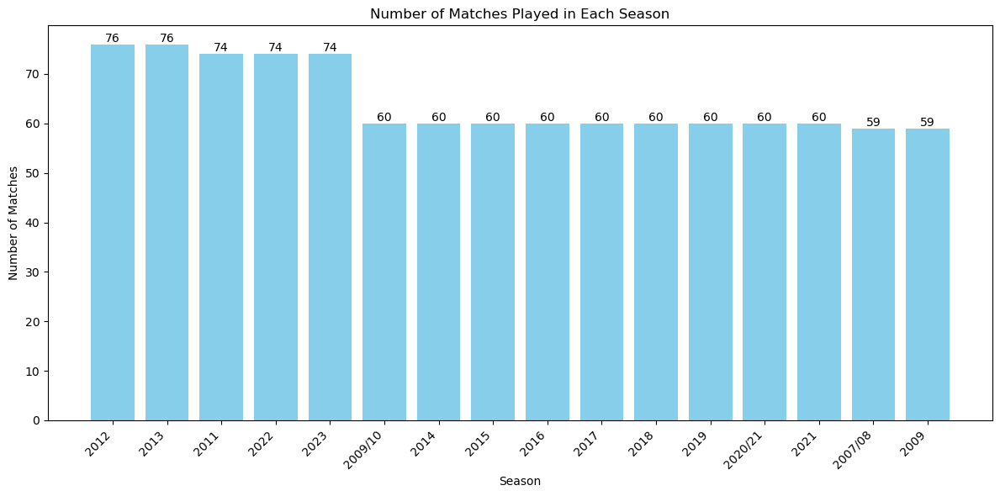

In [133]:
# Sort matches_per_season in descending order
matches_per_season = match_df.groupby('season')['match_no'].count()
matches_per_season_sorted = matches_per_season.sort_values(ascending=False)
print(matches_per_season_sorted)
# Plotting
plt.figure(figsize=(12, 6))
bars = plt.bar(matches_per_season_sorted.index, matches_per_season_sorted, color='skyblue')

for bar, count in zip(bars, matches_per_season_sorted):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height(), 
             f'{count}', 
             ha='center', 
             va='bottom')

# Title and labels
plt.title('Number of Matches Played in Each Season')
plt.xlabel('Season')
plt.ylabel('Number of Matches')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


### 3. What is the average total runs made by each team?
   - **Purpose:** Analyzing the average performance of teams in terms of runs scored.

In [134]:
# Convert 'total_runs_made' column to numeric (if needed)
team_df['total_runs_made'] = pd.to_numeric(team_df['total_runs_made'], errors='coerce')

# Check for missing values and handle them
team_df['total_runs_made'].fillna(0, inplace=True)  # Example: Replace NaN with 0

# Calculate the mean of 'total_runs_made' per team
average_runs_per_team = team_df.groupby('base_team_name')['total_runs_made'].mean().sort_values().round(2)
average_runs_per_team


base_team_name
Kochi Tuskers Kerala           135.79
Pune Warriors                  138.22
Rising Pune Supergiants        147.36
Delhi Daredevils               148.41
Deccan Chargers                150.83
Kolkata Knight Riders          151.98
Rajasthan Royals               153.22
Royal Challengers Bangalore    153.86
Rising Pune Supergiant         154.38
Sunrisers Hyderabad            155.58
Kings XI Punjab                157.98
Mumbai Indians                 159.54
Chennai Super Kings            159.72
Delhi Capitals                 159.82
Gujarat Lions                  161.87
Lucknow Super Giants           163.40
Punjab Kings                   167.83
Gujarat Titans                 173.24
Name: total_runs_made, dtype: float64

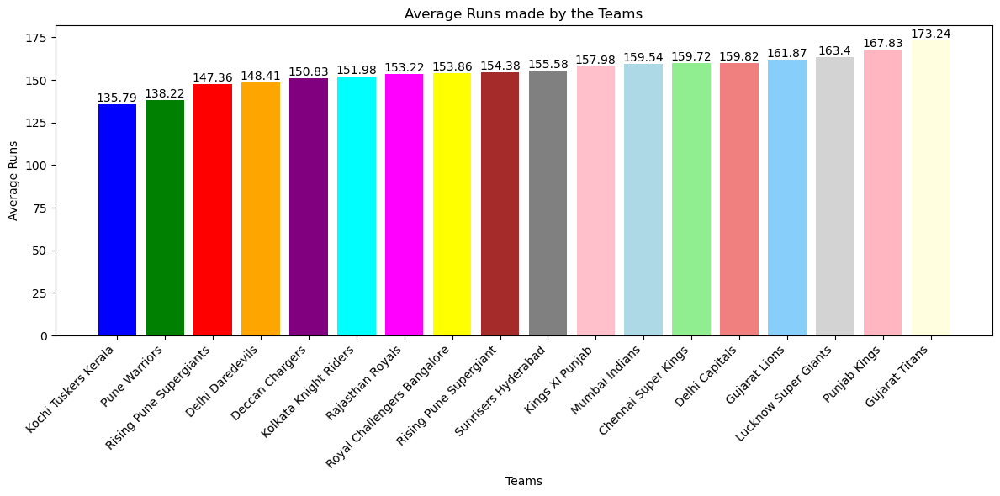

In [135]:
# Extract team names and average runs into separate lists
unique_teams = average_runs_per_team.index.tolist()
average_runs = average_runs_per_team.values.tolist()


# Define colors for each bar
colors = ['blue', 'green', 'red', 'orange', 'purple', 'cyan', 'magenta', 'yellow', 'brown', 'gray', 'pink', 'lightblue', 'lightgreen', 'lightcoral', 'lightskyblue', 'lightgray', 'lightpink', 'lightyellow']


# Plotting
plt.figure(figsize=(12, 6))
bars = plt.bar(unique_teams, average_runs, color=colors)

for bar, count in zip(bars, average_runs):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height(), 
             f'{count}', 
             ha='center', 
             va='bottom')

# Title and labels
plt.title('Average Runs made by the Teams')
plt.xlabel('Teams')
plt.ylabel('Average Runs')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()

### 4. What is the distribution of toss results (win/lost) across all matches?
   - **Purpose:** Assessing the impact of winning the toss on match outcomes.

In [136]:
# Filter the DataFrame for matches where the team won the toss
toss_wins = team_df[team_df['toss'] == 'win']

# Group by 'base_team_name' and count the number of matches won by each team
toss_w = toss_wins.groupby('base_team_name').size().to_dict()

# Display the result
toss_w


{'Chennai Super Kings': 119,
 'Deccan Chargers': 43,
 'Delhi Capitals': 43,
 'Delhi Daredevils': 80,
 'Gujarat Lions': 15,
 'Gujarat Titans': 19,
 'Kings XI Punjab': 85,
 'Kochi Tuskers Kerala': 8,
 'Kolkata Knight Riders': 119,
 'Lucknow Super Giants': 10,
 'Mumbai Indians': 133,
 'Pune Warriors': 20,
 'Punjab Kings': 14,
 'Rajasthan Royals': 109,
 'Rising Pune Supergiant': 6,
 'Rising Pune Supergiants': 7,
 'Royal Challengers Bangalore': 114,
 'Sunrisers Hyderabad': 81}

In [137]:
# Filter the DataFrame for matches where the team won the toss
toss_losses = team_df[team_df['toss'] == 'lost']

# Group by 'base_team_name' and count the number of matches won by each team
toss_l = (toss_losses.groupby('base_team_name').size()).to_dict()

# Display the result
toss_l

{'Chennai Super Kings': 107,
 'Deccan Chargers': 33,
 'Delhi Capitals': 34,
 'Delhi Daredevils': 82,
 'Gujarat Lions': 15,
 'Gujarat Titans': 14,
 'Kings XI Punjab': 105,
 'Kochi Tuskers Kerala': 6,
 'Kolkata Knight Riders': 122,
 'Lucknow Super Giants': 20,
 'Mumbai Indians': 115,
 'Pune Warriors': 26,
 'Punjab Kings': 28,
 'Rajasthan Royals': 100,
 'Rising Pune Supergiant': 10,
 'Rising Pune Supergiants': 7,
 'Royal Challengers Bangalore': 129,
 'Sunrisers Hyderabad': 86}

In [138]:
# Assuming 'toss_w' and 'toss_l' contain the counts of toss wins and losses for each team
toss_w_l = {
    'teams': unique_teams,
    'w/l': []
}

# Calculate win/loss ratio for each team
for team in unique_teams:
    if team in toss_w and team in toss_l:
        toss_w_l['w/l'].append(toss_w[team] / toss_l[team])
    else:
        toss_w_l['w/l'].append(None)  # Handle cases where a team has no toss win or loss data

# Create DataFrame from the dictionary
result_df = pd.DataFrame(toss_w_l)

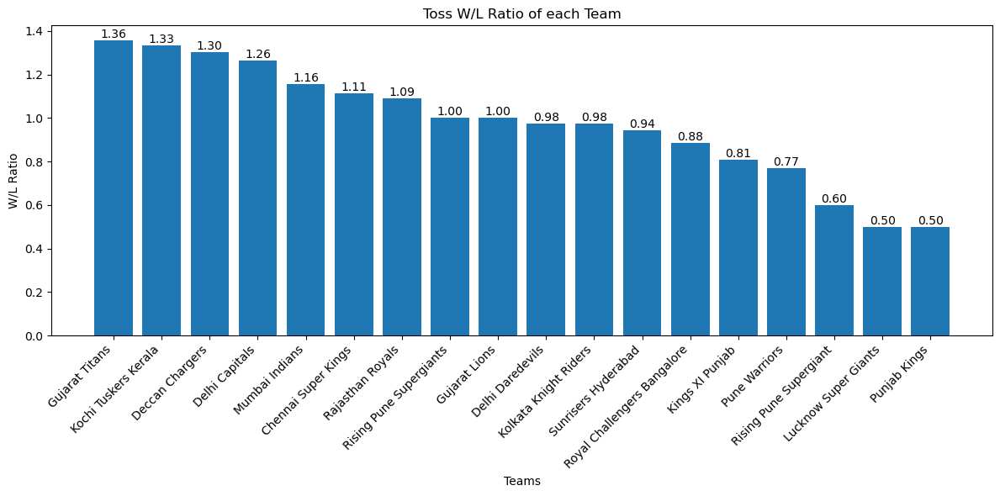

In [139]:


# Sort the DataFrame by 'w/l' column in descending order
result_df.sort_values(by='w/l', ascending=False, inplace=True)

# Plotting
plt.figure(figsize=(12, 6))
bars = plt.bar(result_df['teams'], result_df['w/l'])

for bar, ratio in zip(bars, result_df['w/l']):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height(), 
             f'{ratio:.2f}', 
             ha='center', 
             va='bottom')

# Title and labels
plt.title('Toss W/L Ratio of each Team')
plt.xlabel('Teams')
plt.ylabel('W/L Ratio')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


### 5. How many matches were won by the team batting first and how many by the team batting second?
   - **Purpose:** Understanding the relationship between batting order and match results.

In [140]:
team_bat_first_win = team_df[team_df['inning_1'] == 'bat'][team_df[team_df['inning_1'] == 'bat']['W_or_L']=='win']
team_bat_first_win.shape

(457, 14)

In [141]:
team_bat_second_win = team_df[team_df['inning_2'] == 'bat'][team_df[team_df['inning_2'] == 'bat']['W_or_L']=='win']
team_bat_second_win.shape

(548, 14)

In [142]:
bat_first_vs_second = [len(list(team_bat_first_win['W_or_L'])), len(list(team_bat_second_win['W_or_L']))]

bat_first_vs_second


[457, 548]

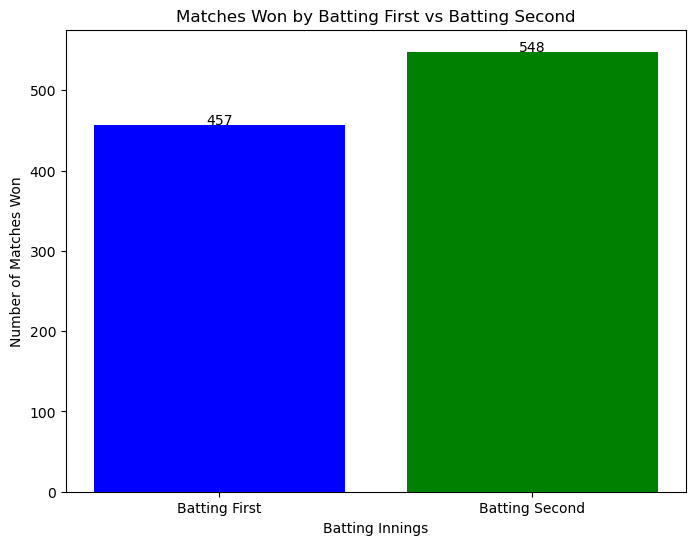

In [143]:
# Data
labels = ['Batting First', 'Batting Second']
matches_won = bat_first_vs_second

# Plotting
plt.figure(figsize=(8, 6))
plt.bar(labels, matches_won, color=['blue', 'green'])

# Adding text labels on top of each bar
for i, v in enumerate(matches_won):
    plt.text(i, v + 0.1, str(v), ha='center')

# Title and labels
plt.title('Matches Won by Batting First vs Batting Second')
plt.xlabel('Batting Innings')
plt.ylabel('Number of Matches Won')

# Display the plot
plt.show()


### 6. What is the average total runs made per match?
   - **Purpose:** Identifying the average scoring trend across matches.

In [144]:
runs_per_match_df = (team_df.groupby('match_no')['total_runs_made'].sum()).to_dict()

runs_per_match = sum(list(runs_per_match_df.values()))/len(runs_per_match_df)

runs_per_match

310.8779069767442

### 7. Which venue hosted the highest number of matches?
   - **Purpose:** Understanding the popularity of different venues for hosting matches.

In [145]:
stadium_dist = match_df.groupby('stadium')['match_no'].count().sort_values(ascending=False)
stadium_dist

stadium
Wankhede Stadium, Mumbai                                                                        111
Eden Gardens, Kolkata                                                                            88
MA Chidambaram Stadium, Chepauk, Chennai                                                         76
M Chinnaswamy Stadium, Bangalore                                                                 76
Feroz Shah Kotla, Delhi                                                                          75
Rajiv Gandhi International Stadium, Uppal, Hyderabad                                             71
Sawai Mansingh Stadium, Jaipur                                                                   52
Dubai International Cricket Stadium                                                              46
Dr DY Patil Sports Academy, Mumbai                                                               37
Punjab Cricket Association Stadium, Mohali, Chandigarh                                      

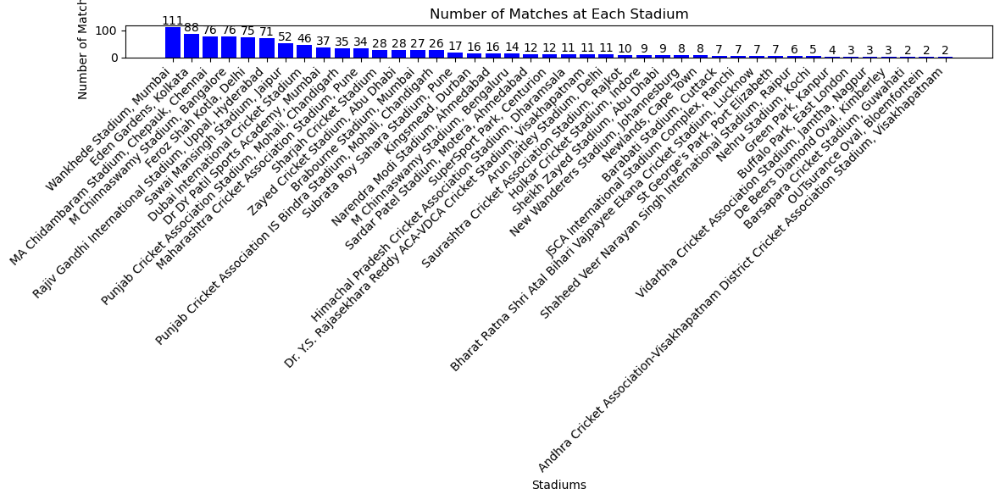

In [146]:
plt.figure(figsize=(12, 6))
bars = plt.bar(stadium_dist.index, stadium_dist, color='blue')

for bar, count in zip(bars, stadium_dist):
    plt.text(bar.get_x() + bar.get_width() / 2, 
             bar.get_height(), 
             f'{count}', 
             ha='center', 
             va='bottom')
    
# Title and labels
plt.title('Number of Matches at Each Stadium')
plt.xlabel('Stadiums')
plt.ylabel('Number of Matches')
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()


### 8. What is the average number of wickets taken per match?
   - **Purpose:** Analyzing the bowling performance across matches.

In [174]:
total_matches = match_df.shape[0]
total_matches

1032

In [177]:
# Assuming team_df is your DataFrame
team_df_wickets = team_df.copy()  # Copying team_df to team_df_wickets

# Replace 'Record does not exist' with 0 in the total_wickets_taken column
team_df_wickets['total_wickets_taken'] = team_df_wickets['total_wickets_taken'].replace('Record does not exist', 0).astype(int)


In [178]:
total_wickets = (((team_df_wickets['total_wickets_taken'].sum())))


average_wickets_per_match = total_wickets/total_matches
average_wickets_per_match

11.628875968992247

### 9. How many matches resulted in a win and how many in a loss?
   - **Purpose:** Understanding the overall win-loss ratio in the dataset.

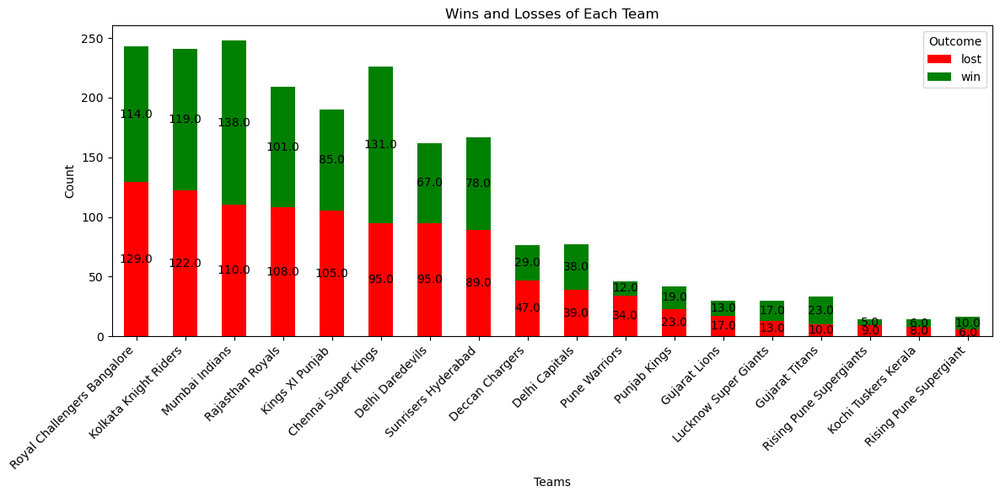

In [192]:
# Group by team name and count wins and losses, and sort the DataFrame
team_w_l = team_df.groupby('base_team_name')['W_or_L'].value_counts().unstack(fill_value=0).sort_values(by=['lost', 'win'], ascending=False)

# Plotting stacked bar graph
ax = team_w_l.plot(kind='bar', stacked=True, figsize=(12, 6), color=['red', 'green'])

# Add data labels to each bar
for p in ax.patches:
    width = p.get_width()
    height = p.get_height()
    x, y = p.get_xy()    
    ax.annotate(f'{height}', (x + width/2, y + height*0.5), ha='center', va='center')

# Title and labels
plt.title('Wins and Losses of Each Team')
plt.xlabel('Teams')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')

plt.legend(title='Outcome')

plt.tight_layout()
plt.show()


### 10. Is there any correlation between total runs made and total runs given by a team?
   - **Purpose:** Assessing if batting performance correlates with bowling performance.

In [193]:
# Compute Pearson correlation coefficient
correlation = team_df['total_runs_made'].corr(team_df['total_runs_given'])

print(f"Pearson's correlation coefficient: {correlation}")

TypeError: unsupported operand type(s) for +: 'int' and 'str'